# Read the data and rename some parameters
Ref: He et al., 2011, SIMULATING TRANSIENT CLIMATE EVOLUTION OF THE LAST DEGLACIATION WITH CCSM3

<bound method Dataset.info of <xarray.Dataset>
Dimensions:  (age: 2204, lat: 48, lon: 96)
Coordinates:
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2
  * age      (age) float64 2.2e+04 2.199e+04 2.198e+04 ... -10.0 -20.0 -30.0
Data variables:
    sat      (age, lat, lon) float32 -57.14 -57.51 -57.91 ... -24.48 -24.36
Attributes:
    Conventions:               CF-1.0
    source:                    CAM
    case:                      b30.22_0kaDVT
    title:                     b30.22_0kaDVT b30.22_0kaDVT
    logname:                   fenghe
    host:                      phoenix
    Version:                   $Name: ccsm3_0_1_beta22 $
    revision_Id:               $Id: history.F90,v 1.26.2.48.4.1.4.1 2006/01/2...
    history:                   Sat Oct 26 04:30:38 2013: /glade/apps/opt/nco/...
    nco_openmp_thread_number:  1
    NCO:                       4.2.3>

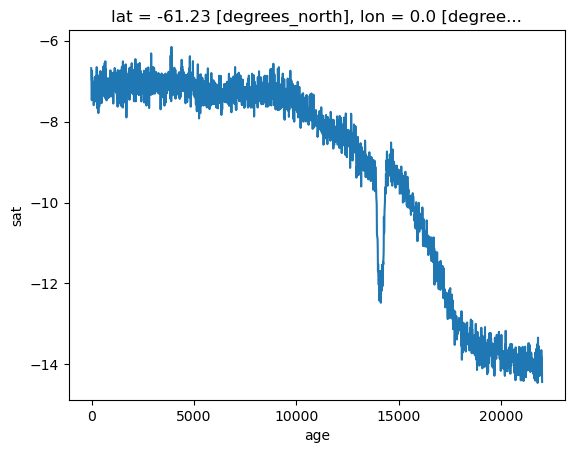

In [1]:
import xarray as xr

# import .nc data
ds = xr.open_dataset('TraCE_data/trace.01-36.22000BP.cam2.TREFHT.22000BP_decavg_400BCE.nc')

# rename the TREFHT to sat
ds = ds.rename({'TREFHT': 'sat'})
# rename the time to age
ds = ds.rename({'time': 'age'})
# multiply age by 1000
ds['age'] = ds['age'] * -1000

# convert the sat to degrees C
ds['sat'] = ds['sat'] - 273.15

ds = ds[['sat']]

# plot a record from the ds_sat at given lat and lon
ds['sat'].isel(lat=7, lon=0).plot()

ds_sat=ds

ds_sat.info


# Smooth the data

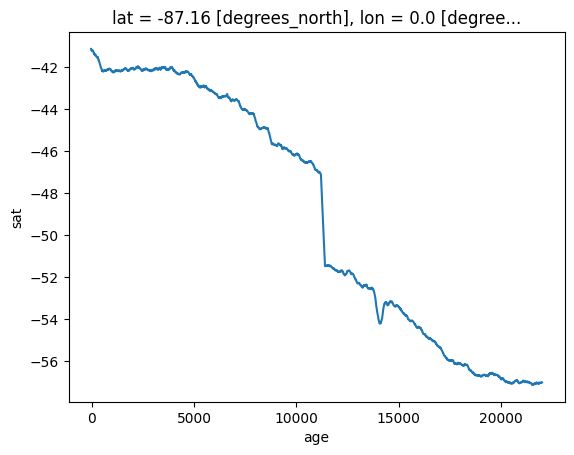

In [107]:
import numpy as np
import xarray as xr

# smoothed_sat = ds['sat'].rolling(age=10, center=True).mean()
smoothed_sat = ds['sat'].rolling(age=20, center=True, min_periods=1).mean()
ds_sat = smoothed_sat.to_dataset(name='sat')
ds_sat['sat'].isel(lat=0, lon=0).plot()

# Crop the data

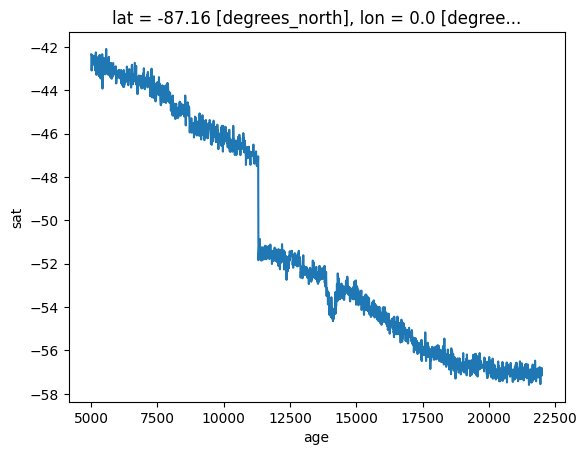

In [142]:
ds_sat=ds
ds_sat = ds_sat.where(ds_sat.age>=5000, drop=True)
ds_sat['sat'].isel(lat=0, lon=0).plot()

# PCA

shape of the weight: (48,)
shape of the reshaped sat_centered_weighted: (2204, 4608)


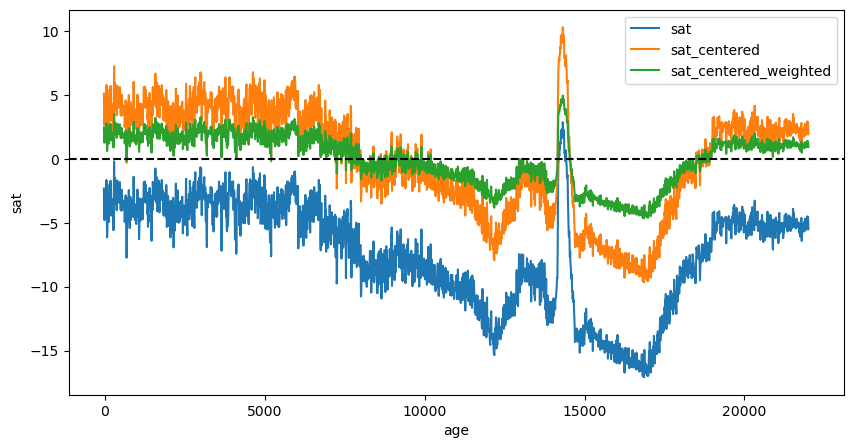

In [2]:
from toolbox import PCA_functions as pf
# 1. Center the Data
ds_sat = pf.center_data(ds_sat)

# 2. Weight the Data
ds_sat = pf.apply_weighting(ds_sat)

# 3. Plot the Centered and Weighted Data
# Assuming you want to plot data for lat=0 and lon=0
lat_index = 40
lon_index = 90
pf.plot_sat_variables(ds_sat, lat_index, lon_index)


In [3]:
from toolbox import PCA_functions as pf
# 4. Perform PCA
exp_variance, eofs, pcs = pf.sat_PCA(ds_sat)
print('Explained variance:', exp_variance)


shape of the reshaped sat_centered_weighted: (4608, 2204)
shape of u, s, vh: (4608, 4608) (2204,) (2204, 2204)
shape of EOFs: (4608, 2)
shape of PCs: (2204, 2)
Explained variance: [9.05370503e-01 5.56376438e-02 1.35933226e-02 ... 1.74683888e-10
 1.70352439e-10 1.65461020e-11]


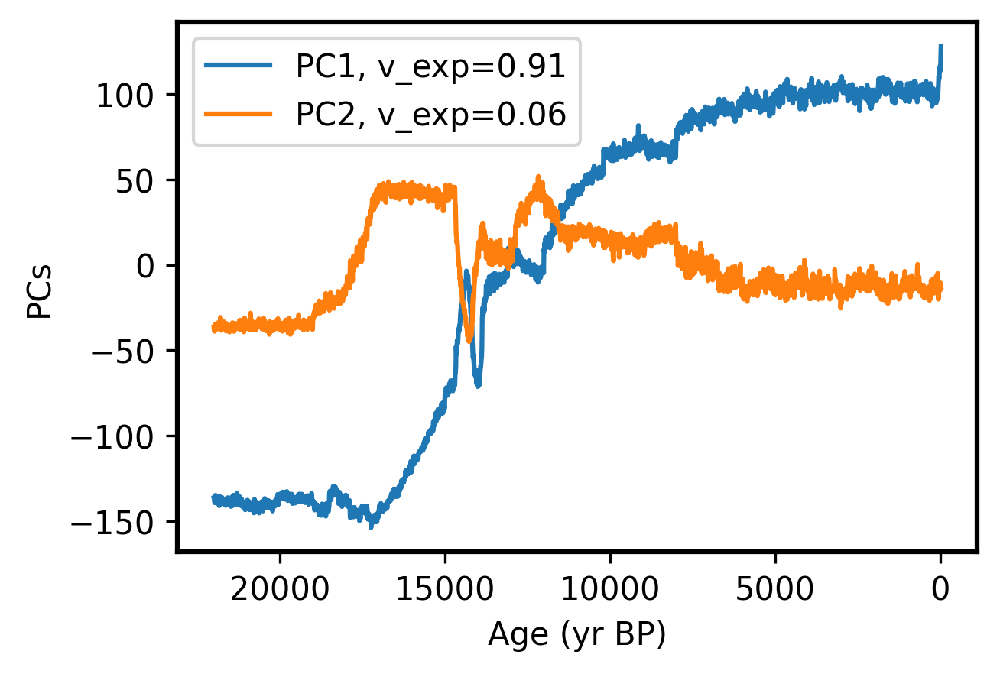

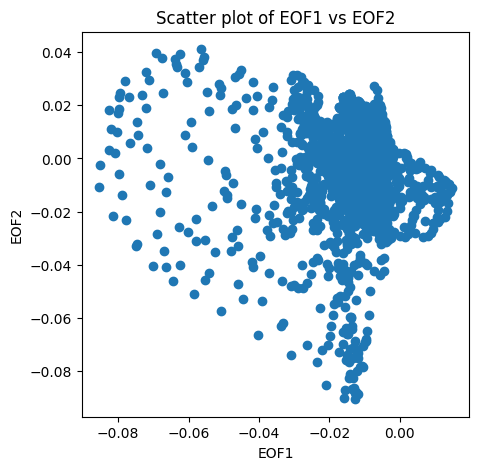

d:\VScode\Last_deglaciation\toolbox\PCA_functions.py:309: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


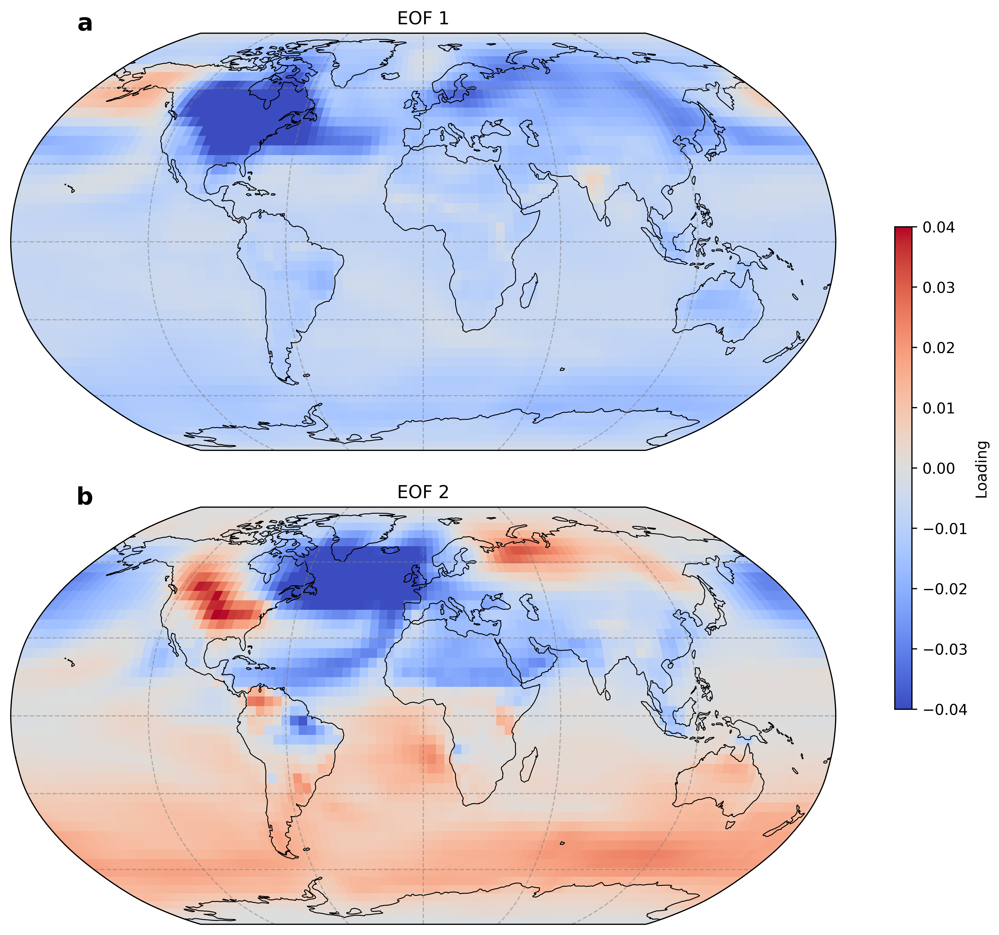

(<Figure size 4800x5400 with 3 Axes>,
 array([<GeoAxesSubplot: title={'center': 'EOF 1'}>,
        <GeoAxesSubplot: title={'center': 'EOF 2'}>], dtype=object))

In [4]:
# 5. Plot PCs
pf.plot_pcs(ds_sat['age'].values, pcs, exp_variance)

# 6. Plot EOF Scatter
pf.plot_eof_scatter(eofs)

# 7. Plot the EOF Map
pf.plot_eof_map(eofs, ds_sat['lat'].values, ds_sat['lon'].values)

# AIC

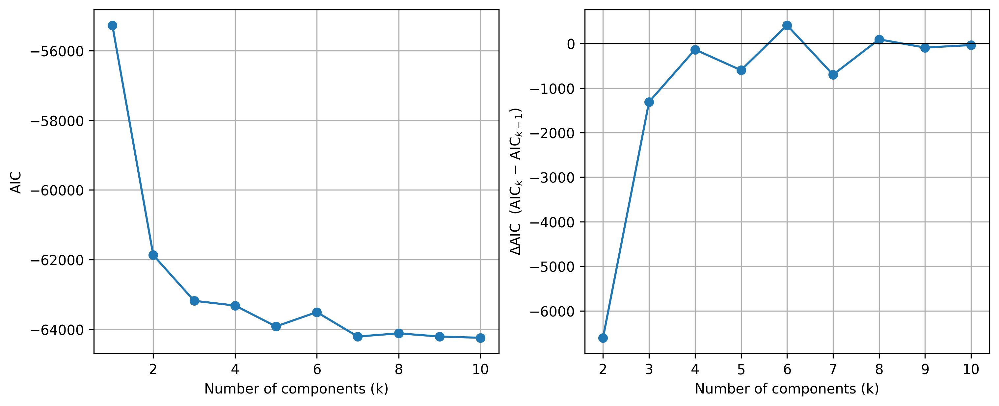

AIC values: [-55268.11602013 -61871.84373146 -63183.36198841 -63320.01063855
 -63919.81825943 -63509.35751446 -64210.39075827 -64118.02517623
 -64210.37185908 -64245.94000158]
ΔAIC values: [-6603.72771133 -1311.51825695  -136.64865014  -599.80762088
   410.46074497  -701.03324381    92.36558204   -92.34668285
   -35.5681425 ]


In [23]:
from toolbox import GMM_functions as gf
import importlib
importlib.reload(gf)
import matplotlib.pyplot as plt


# ── run it on your EOF loadings (or PCs) ──────────────────────────
aic, delta_aic = gf.gmm_aic_curve(eofs, max_components=10, init_params='random')


# ── side-by-side plot ────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=300,
                         constrained_layout=True)

k_vals = np.arange(1, len(aic) + 1)
k_vals_diff = np.arange(2, len(aic) + 1)   # starts at k = 2

# AIC
axes[0].plot(k_vals, aic, marker='o')
axes[0].set_xlabel('Number of components (k)')
axes[0].set_ylabel('AIC')
# axes[0].set_title('GMM AIC')
axes[0].grid(True)

# ΔAIC = AIC(k) − AIC(k−1)
axes[1].plot(k_vals_diff, delta_aic, marker='o')
axes[1].axhline(0, color='k', lw=0.8)      # reference line
axes[1].set_xlabel('Number of components (k)')
axes[1].set_ylabel(r'$\Delta$AIC  (AIC$_k$ − AIC$_{k-1}$)')
# axes[1].set_title('ΔAIC between successive models')
axes[1].grid(True)

plt.show()


# print AIC and ΔAIC values
print("AIC values:", aic)
print("ΔAIC values:", delta_aic)


# GMM

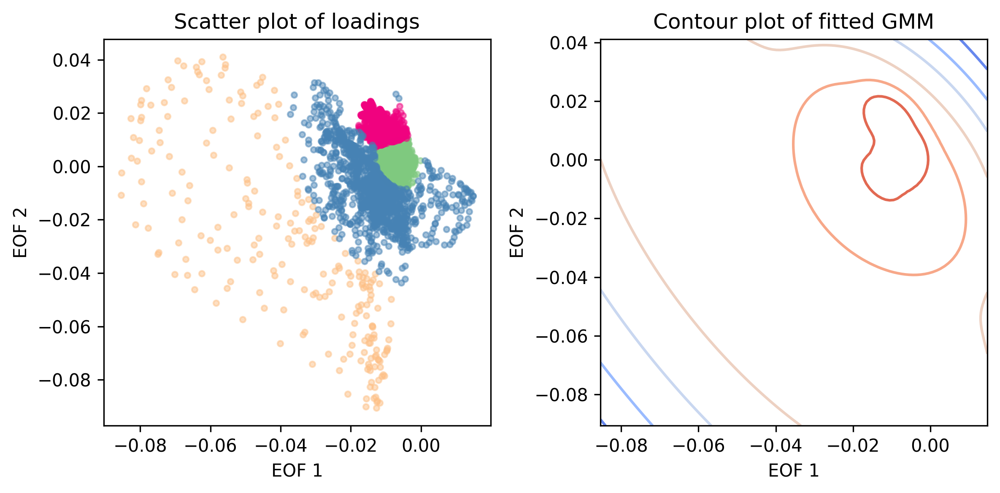

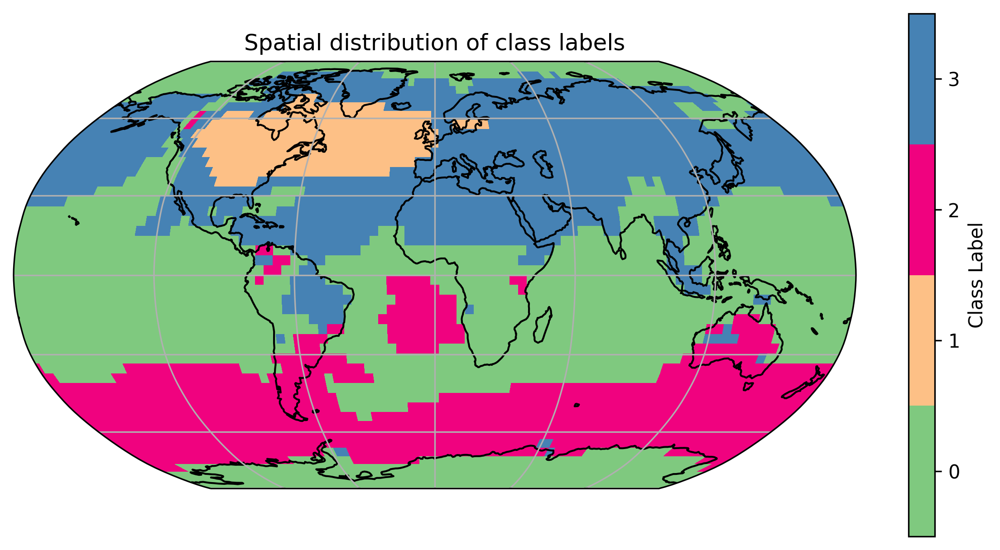

In [28]:
from toolbox import GMM_functions as gf
ds_TraCE_EOFs_GMM,reshaped_probs=gf.GMM4EOFS(eofs, ds_sat,n_components=4,init_params='kmeans')
gf.plot_labels(ds_TraCE_EOFs_GMM)

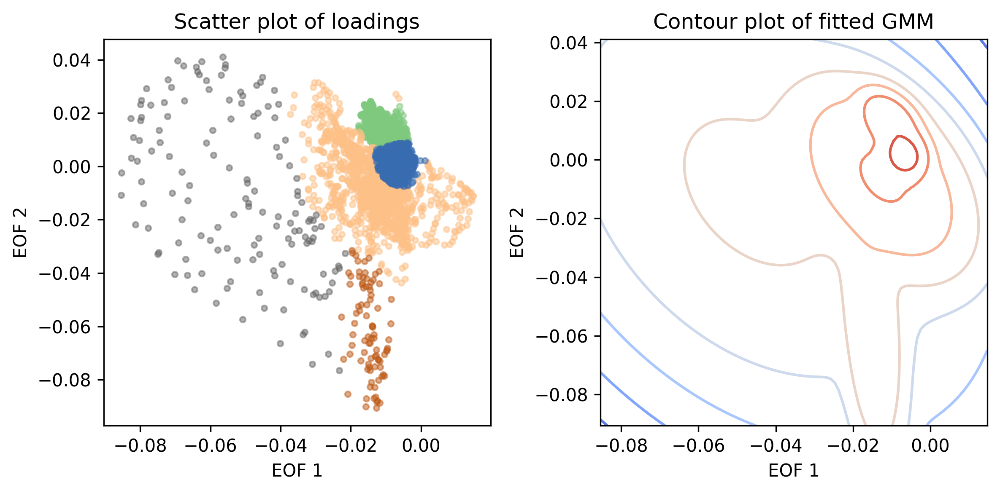

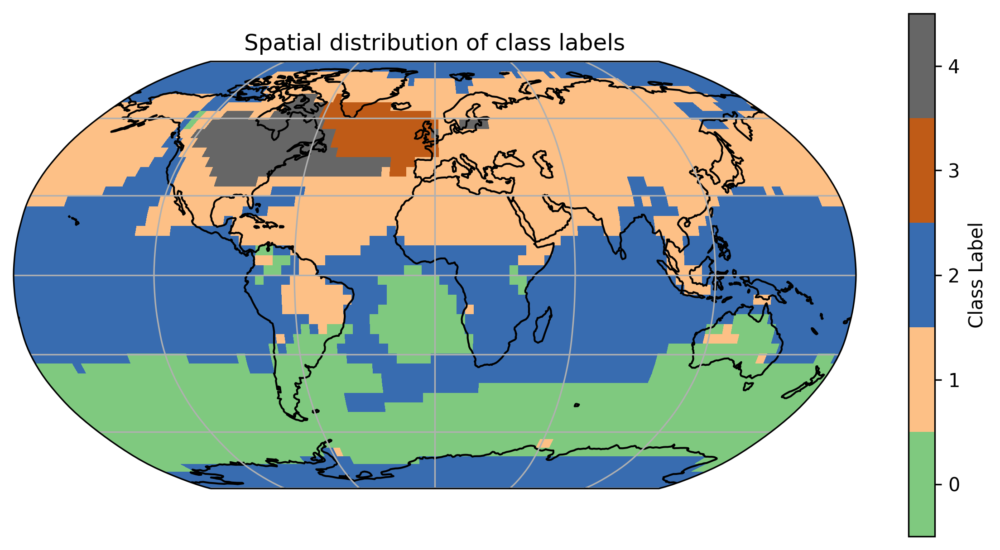

In [16]:
from toolbox import GMM_functions as gf
import importlib
importlib.reload(gf)

ds_TraCE_EOFs_GMM,reshaped_probs=gf.GMM4EOFS(eofs, ds_sat,n_components=5,init_params='kmeans')
gf.plot_labels(ds_TraCE_EOFs_GMM)

In [24]:
from toolbox import GMM_functions as gf
import importlib
importlib.reload(gf) 

uncor_weighted_avg=gf.plot_weighted_average_curve(ds_TraCE_EOFs_GMM.copy(), dpi=900)

In [175]:
reshaped_probs_TraCE_GMM=reshaped_probs

5th percentile: 0.5676246792723479


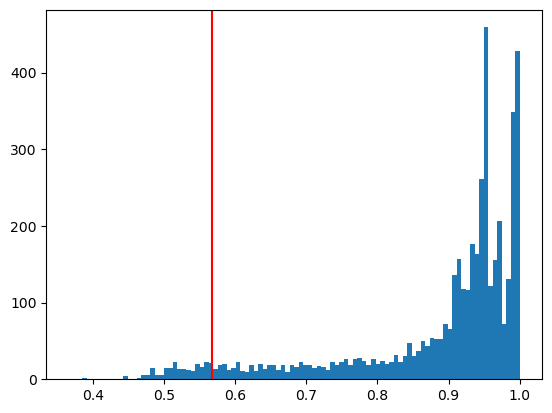

In [13]:


# plot a histogram of the reshaped probabilities
import matplotlib.pyplot as plt
plt.hist(reshaped_probs_TraCE_GMM.reshape(48*96,1), bins=100)
# plot the 5th percentile
plt.axvline(x=np.percentile(reshaped_probs_TraCE_GMM, 5), color='r')
print('5th percentile:', np.percentile(reshaped_probs_TraCE_GMM, 5))
plt.show()


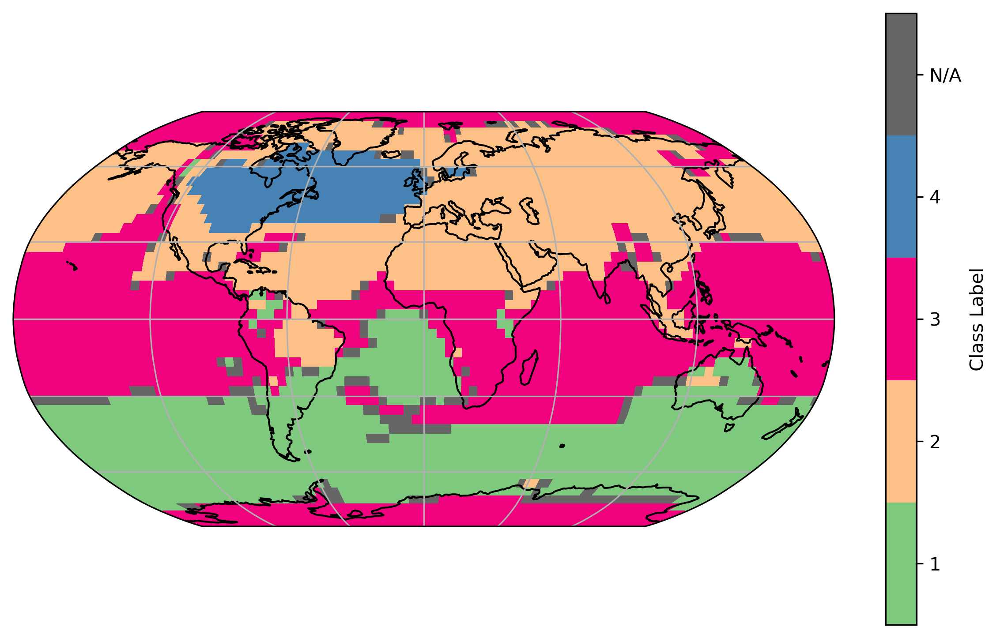

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import ListedColormap


ds_GMM_climo_relabeled=ds_TraCE_EOFs_GMM
prob=reshaped_probs_TraCE_GMM


class_labels = ds_GMM_climo_relabeled['class_label'].values  # Ensure this is your class label data

n_components = 4
# Define a new class label for low probabilities
low_prob_label = n_components  # Assuming this is the next integer after your max class label

# Update class_labels for locations where prob < 0.9 to the new class
class_labels_updated = np.where(prob < 0.56, low_prob_label, class_labels)

# Custom colors including gray for low probability
custom_colors = [
    (0.4980392156862745, 0.788235294117647, 0.4980392156862745),
    (0.9921568627450981, 0.7529411764705882, 0.5254901960784314),
    (0.9411764705882353, 0.00784313725490196, 0.4980392156862745),
    (0.27450980392156865, 0.5098039215686274, 0.7058823529411765),
    (0.4, 0.4, 0.4)  # Gray for low prob
]
cmap = ListedColormap(custom_colors)

# Setup plot
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.Robinson()}, figsize=(10, 6), dpi=300)
ax.add_feature(cfeature.COASTLINE)
ax.gridlines()

# Generating meshgrid for lon-lat with one additional point in each dimension
lon, lat = np.meshgrid(np.linspace(ds_GMM_climo_relabeled.lon.min(), ds_GMM_climo_relabeled.lon.max(), len(ds_GMM_climo_relabeled.lon)), 
                       np.linspace(ds_GMM_climo_relabeled.lat.min(), ds_GMM_climo_relabeled.lat.max(), len(ds_GMM_climo_relabeled.lat)))

# Plot using pcolormesh
pcolormesh = ax.pcolormesh(lon, lat, class_labels_updated, cmap=cmap, shading='auto', transform=ccrs.PlateCarree())

# Colorbar setup
bounds = np.arange(-0.5, len(custom_colors)+1 - 0.5, 1)
cbar = plt.colorbar(pcolormesh, boundaries=bounds, ticks=np.arange(len(custom_colors)), label='Class Label')
cbar.set_ticklabels(['1', '2', '3', '4', 'N/A'])  # Adjust labels as needed

plt.show()


In [176]:
# save the ds_TraCE_EOFs_GMM
ds_TraCE_EOFs_GMM.to_netcdf('TraCE_data/ds_TraCE_EOFs_GMM.nc')
# save the reshaped_probs_TraCE_GMM, which is a numpy array
np.save('TraCE_data/reshaped_probs_TraCE_GMM.npy', reshaped_probs_TraCE_GMM)


In [3]:
import xarray as xr
import numpy as np

# read the ds_TraCE_EOFs_GMM    
ds_TraCE_EOFs_GMM = xr.open_dataset('TraCE_data/ds_TraCE_EOFs_GMM.nc')
# read the reshaped_probs_TraCE_GMM
reshaped_probs_TraCE_GMM = np.load('TraCE_data/reshaped_probs_TraCE_GMM.npy')

In [193]:
uncor_weighted_avg_TraCE_GMM=uncor_weighted_avg

In [197]:
# save the uncor_weighted_avg_TraCE_GMM, which is a dict
np.save('TraCE_data/uncor_weighted_avg_TraCE_GMM.npy', uncor_weighted_avg_TraCE_GMM)

In [178]:
from toolbox import GMM_functions as gf
import importlib
importlib.reload(gf) 

uncor_weighted_avg=gf.plot_weighted_average_curve(ds_TraCE_EOFs_GMM.copy(), dpi=900)

# Another GMM pattern

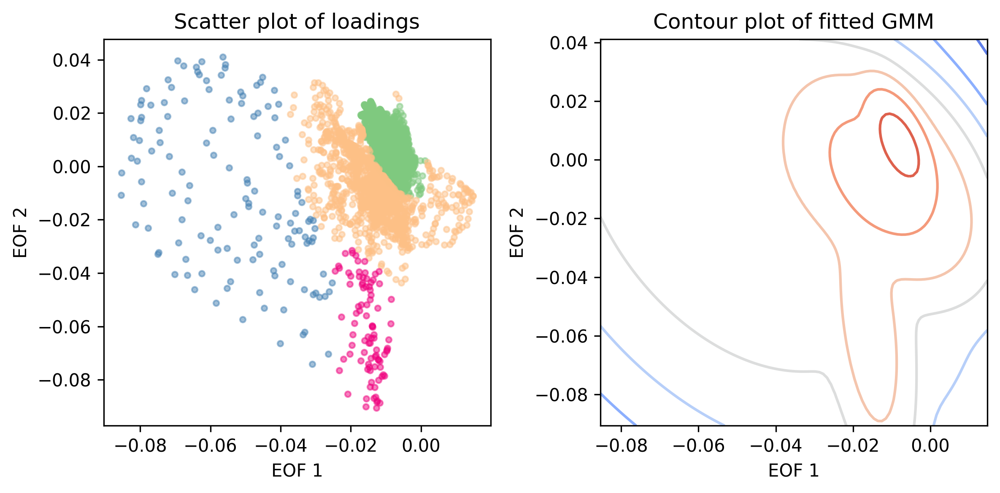

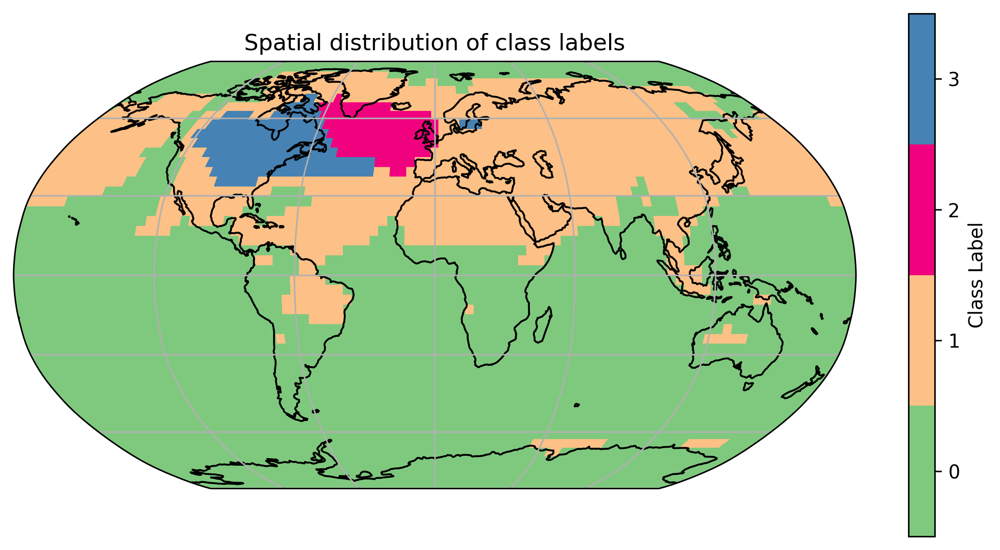

In [183]:
from toolbox import GMM_functions as gf
ds_TraCE_EOFs_GMM_patternv2,reshaped_probs_TraCE_GMM_patternv2=gf.GMM4EOFS(eofs, ds_sat,n_components=4,init_params='kmeans')
gf.plot_labels(ds_TraCE_EOFs_GMM_patternv2)

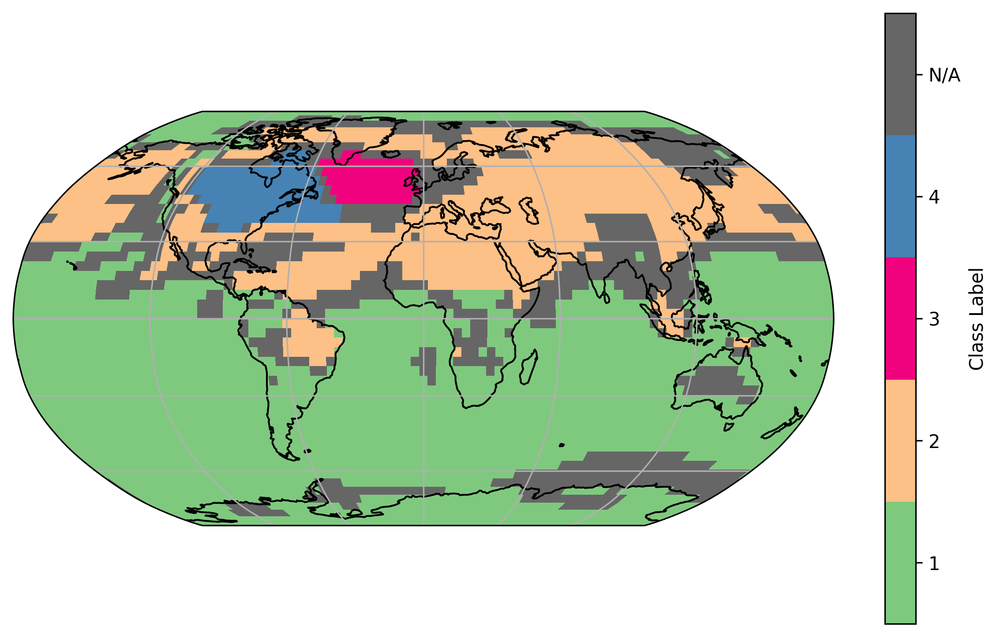

In [189]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import ListedColormap


ds_GMM_climo_relabeled=ds_TraCE_EOFs_GMM_patternv2
prob=reshaped_probs_TraCE_GMM_patternv2


class_labels = ds_GMM_climo_relabeled['class_label'].values  # Ensure this is your class label data

n_components = 4
# Define a new class label for low probabilities
low_prob_label = n_components  # Assuming this is the next integer after your max class label

# Update class_labels for locations where prob < 0.9 to the new class
class_labels_updated = np.where(prob < 0.9, low_prob_label, class_labels)

# Custom colors including gray for low probability
custom_colors = [
    (0.4980392156862745, 0.788235294117647, 0.4980392156862745),
    (0.9921568627450981, 0.7529411764705882, 0.5254901960784314),
    (0.9411764705882353, 0.00784313725490196, 0.4980392156862745),
    (0.27450980392156865, 0.5098039215686274, 0.7058823529411765),
    (0.4, 0.4, 0.4)  # Gray for low prob
]
cmap = ListedColormap(custom_colors)

# Setup plot
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.Robinson()}, figsize=(10, 6), dpi=300)
ax.add_feature(cfeature.COASTLINE)
ax.gridlines()

# Generating meshgrid for lon-lat with one additional point in each dimension
lon, lat = np.meshgrid(np.linspace(ds_GMM_climo_relabeled.lon.min(), ds_GMM_climo_relabeled.lon.max(), len(ds_GMM_climo_relabeled.lon)), 
                       np.linspace(ds_GMM_climo_relabeled.lat.min(), ds_GMM_climo_relabeled.lat.max(), len(ds_GMM_climo_relabeled.lat)))

# Plot using pcolormesh
pcolormesh = ax.pcolormesh(lon, lat, class_labels_updated, cmap=cmap, shading='auto', transform=ccrs.PlateCarree())

# Colorbar setup
bounds = np.arange(-0.5, len(custom_colors)+1 - 0.5, 1)
cbar = plt.colorbar(pcolormesh, boundaries=bounds, ticks=np.arange(len(custom_colors)), label='Class Label')
cbar.set_ticklabels(['1', '2', '3', '4', 'N/A'])  # Adjust labels as needed

plt.show()


In [184]:
# save the ds_TraCE_EOFs_GMM_patternv2,reshaped_probs_TraCE_GMM_patternv2\
ds_TraCE_EOFs_GMM_patternv2.to_netcdf('TraCE_data/ds_TraCE_EOFs_GMM_patternv2.nc')  
np.save('TraCE_data/reshaped_probs_TraCE_GMM_patternv2.npy', reshaped_probs_TraCE_GMM_patternv2)

In [185]:
# load the ds_TraCE_EOFs_GMM_patternv2,reshaped_probs_TraCE_GMM_patternv2
ds_TraCE_EOFs_GMM_patternv2 = xr.open_dataset('TraCE_data/ds_TraCE_EOFs_GMM_patternv2.nc')
reshaped_probs_TraCE_GMM_patternv2 = np.load('TraCE_data/reshaped_probs_TraCE_GMM_patternv2.npy')

In [186]:
# plot the weighted average curve

uncor_weighted_avg_patternv2=gf.plot_weighted_average_curve(ds_TraCE_EOFs_GMM_patternv2.copy(), dpi=900)

In [191]:
ds_TraCE_EOFs_GMM.info

<bound method Dataset.info of <xarray.Dataset>
Dimensions:                (age: 2204, lat: 48, lon: 96)
Coordinates:
  * lat                    (lat) float64 -87.16 -83.48 -79.78 ... 83.48 87.16
  * lon                    (lon) float64 0.0 3.75 7.5 ... 348.8 352.5 356.2
  * age                    (age) float64 2.2e+04 2.199e+04 ... -20.0 -30.0
Data variables:
    sat                    (age, lat, lon) float32 ...
    sat_centered           (age, lat, lon) float32 ...
    weight                 (lat) float64 ...
    sat_centered_weighted  (age, lat, lon) float64 ...
    class_label            (lat, lon) int64 2 2 2 2 2 2 2 2 ... 2 2 2 2 2 2 2 2
Attributes:
    Conventions:               CF-1.0
    source:                    CAM
    case:                      b30.22_0kaDVT
    title:                     b30.22_0kaDVT b30.22_0kaDVT
    logname:                   fenghe
    host:                      phoenix
    Version:                   $Name: ccsm3_0_1_beta22 $
    revision_Id:         

# Roughly 58 out of 100 are similar to the LGMR result (K=4)

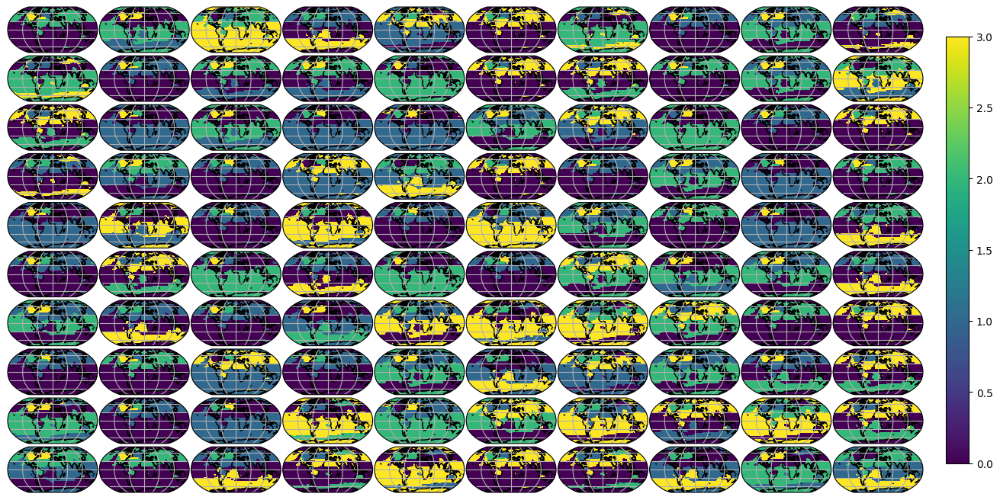

In [192]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import ListedColormap

# Define a function to perform GMM and return class labels
def perform_gmm(data, n_components=4, init_params='kmeans'):
    gmm_model = GaussianMixture(n_components=n_components, covariance_type='full', init_params=init_params)
    gmm_model.fit(data)
    class_labels = gmm_model.predict(data)
    return class_labels

# Loop over GMM computation and store results
results = []
n_loops = 100
for i in range(n_loops):
    class_labels = perform_gmm(eofs)  
    results.append(class_labels.reshape(48, 96))  # Reshape if needed based on your data's lat-lon dimensions

# Function to plot results on a map
def plot_class_labels_grids(results, n_rows=10, n_cols=10):
    fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 8),
                            subplot_kw={'projection': ccrs.Robinson()},
                            dpi=100)
    for idx, ax in enumerate(axs.flat):
        if idx < len(results):
            ax.add_feature(cfeature.COASTLINE)
            ax.gridlines()
            im = ax.pcolormesh(ds_sat['lon'], ds_sat['lat'], results[idx],
                               transform=ccrs.PlateCarree(),
                               cmap='viridis')
        else:
            ax.set_visible(False)
        ax.set_global()
    
    # Add a colorbar
    plt.subplots_adjust(bottom=0.1, top=0.9, left=0.05, right=0.85,
                        wspace=0.02, hspace=0.02)
    cbar_ax = fig.add_axes([0.87, 0.15, 0.02, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    plt.show()

# Call the plotting function
plot_class_labels_grids(results)


# 45 out of 100

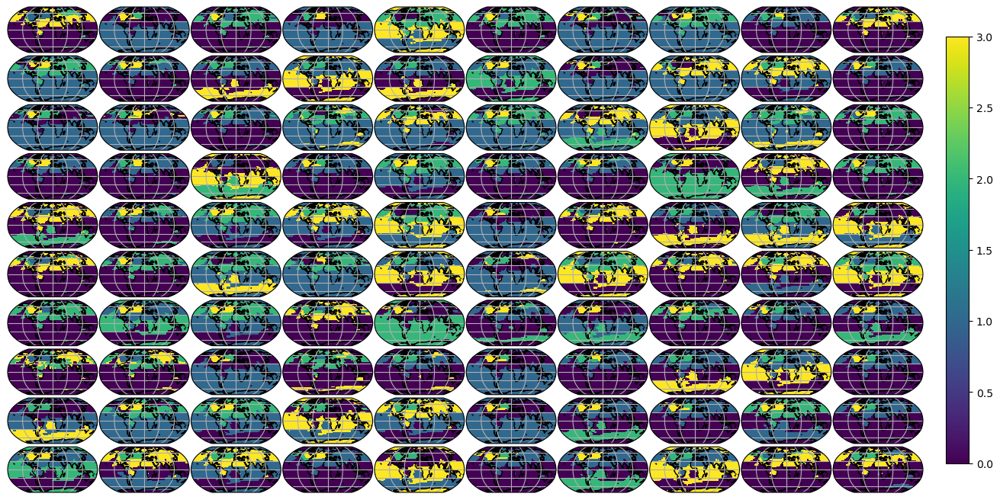

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import ListedColormap

# Define a function to perform GMM and return class labels
def perform_gmm(data, n_components=4, init_params='k-means++'):
    gmm_model = GaussianMixture(n_components=n_components, covariance_type='full', init_params=init_params)
    gmm_model.fit(data)
    class_labels = gmm_model.predict(data)
    return class_labels

# Loop over GMM computation and store results
results = []
n_loops = 100
for i in range(n_loops):
    class_labels = perform_gmm(eofs)  
    results.append(class_labels.reshape(48, 96))  # Reshape if needed based on your data's lat-lon dimensions

# Function to plot results on a map
def plot_class_labels_grids(results, n_rows=10, n_cols=10):
    fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 8),
                            subplot_kw={'projection': ccrs.Robinson()},
                            dpi=100)
    for idx, ax in enumerate(axs.flat):
        if idx < len(results):
            ax.add_feature(cfeature.COASTLINE)
            ax.gridlines()
            im = ax.pcolormesh(ds_sat['lon'], ds_sat['lat'], results[idx],
                               transform=ccrs.PlateCarree(),
                               cmap='viridis')
        else:
            ax.set_visible(False)
        ax.set_global()
    
    # Add a colorbar
    plt.subplots_adjust(bottom=0.1, top=0.9, left=0.05, right=0.85,
                        wspace=0.02, hspace=0.02)
    cbar_ax = fig.add_axes([0.87, 0.15, 0.02, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    plt.show()

# Call the plotting function
plot_class_labels_grids(results)


# Roughly 96 out of 100 are similar to the LGMR result (K=4)

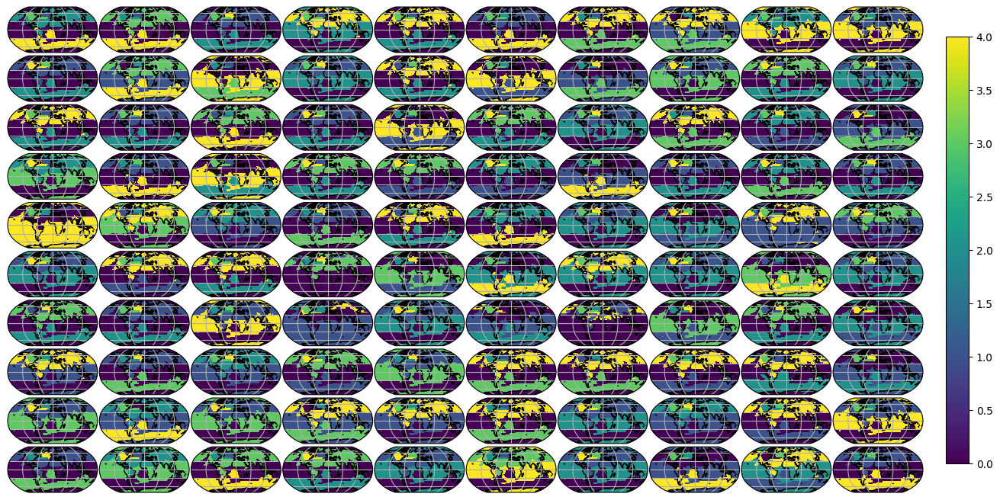

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import ListedColormap

# Define a function to perform GMM and return class labels
def perform_gmm(data, n_components=5, init_params='kmeans'):
    gmm_model = GaussianMixture(n_components=n_components, covariance_type='full', init_params=init_params)
    gmm_model.fit(data)
    class_labels = gmm_model.predict(data)
    return class_labels

# Loop over GMM computation and store results
results = []
n_loops = 100
for i in range(n_loops):
    class_labels = perform_gmm(eofs)  
    results.append(class_labels.reshape(48, 96))  # Reshape if needed based on your data's lat-lon dimensions

# Function to plot results on a map
def plot_class_labels_grids(results, n_rows=10, n_cols=10):
    fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 8),
                            subplot_kw={'projection': ccrs.Robinson()},
                            dpi=100)
    for idx, ax in enumerate(axs.flat):
        if idx < len(results):
            ax.add_feature(cfeature.COASTLINE)
            ax.gridlines()
            im = ax.pcolormesh(ds_sat['lon'], ds_sat['lat'], results[idx],
                               transform=ccrs.PlateCarree(),
                               cmap='viridis')
        else:
            ax.set_visible(False)
        ax.set_global()
    
    # Add a colorbar
    plt.subplots_adjust(bottom=0.1, top=0.9, left=0.05, right=0.85,
                        wspace=0.02, hspace=0.02)
    cbar_ax = fig.add_axes([0.87, 0.15, 0.02, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    plt.show()

# Call the plotting function
plot_class_labels_grids(results)
